In [ ]:
#!pip3 install contextily statsmodels

In [1]:
import osmnx as ox
import geopandas as gpd
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import ast
import pathlib
import time
import contextily as ctx # for basemaps
import statsmodels.api as sm
import math
%matplotlib inline

In [2]:
# turn response caching on and turn on logging to your terminal window
ox.config(log_console=True, use_cache=True)

ox.__version__

'1.0.1'

In [3]:
places = [{'county' : 'Merida',
           'state' : 'Yucatan',
           'country' : 'Mexico'},
          {'county' : 'Kanasin',
           'state' : 'Yucatan',
           'country' : 'Mexico'}]

def get_roads_osmnx(places, update=False, proj=False, crs=None):

    dirpath = pathlib.Path('./networks/')
    filepath = dirpath/'merida-kanasin-road.graphml'
    logpath = dirpath/'log'
                                    
    if filepath.exists() and not update:
        G = ox.load_graphml(filepath)
    else:
        # get drivable public streets network, aka road network, without service roads,
        # e.g. private, parking lots, etc.
        # use retain_all if you want to keep all disconnected subgraphs (e.g. when your places aren't adjacent)
        # TODO: It would be nice to setup up a polygon for the city and its surrounding areas, to be sure
        # exactly the location.
        G = ox.graph_from_place(places, network_type='drive')
        ox.save_graphml(G, filepath=filepath, gephi=False)
        
    if proj:
        G = ox.project_graph(G, to_crs=crs)
    
    print(f"Graph created at: {G.graph['created_date']}")
    return G, *ox.graph_to_gdfs(G)
        
#G, nodes, edges = get_roads_osmnx(places, update=False)
G_proj, nodes_proj, edges_proj = get_roads_osmnx(places, update=False, proj=True, crs=3857)

Graph created at: 2021-02-17 11:57:58


In [9]:
print(f"The road network has {G_proj.number_of_edges()} edges and {G_proj.number_of_nodes()} nodes")

The road network has 102400 edges and 37906 nodes


In [5]:
# get largest strongly connected component
Gs = ox.utils_graph.get_largest_component(G_proj, strongly=True)

In [6]:
print(f"The largest strongly connected component has {Gs.number_of_edges()/G_proj.number_of_edges()} edges and {Gs.number_of_nodes()/G_proj.number_of_nodes()} nodes")

The largest strongly connected component has 0.997373046875 edges and 0.9957790323431647 nodes


At the boundary of the municipality some parts of the network are not reachable due to a not well-defined boundary limit.

In [7]:
print(f"The largest component has {Gs.number_of_edges()} edges and {Gs.number_of_nodes()} nodes")

The largest component has 102131 edges and 37746 nodes


In [8]:
nodes, edges = ox.graph_to_gdfs(Gs)

In [9]:
## what sized area does our network cover in square meters?
graph_area_m = nodes.unary_union.convex_hull.area # Squared meters
graph_area_km = graph_area_m / 1e6 # squared kilometers
print(f"{round(graph_area_m, 2)} squared meters")
print(f"{round(graph_area_km, 2)} squared kilometers")

1143560868.36 squared meters
1143.56 squared kilometers


# View the properties of each city road network

## Merida

In [33]:
places = [{'county' : 'Merida',
           'state' : 'Yucatan',
           'country' : 'Mexico'}]
G = ox.graph_from_place(places, network_type='drive')
G = ox.project_graph(G, to_crs=3857)
# get largest strongly connected component
Gs_mid = ox.utils_graph.get_largest_component(G, strongly=True)
nodes_merida = ox.graph_to_gdfs(Gs_mid, nodes=True, edges=False)

In [34]:
print(f"The road network has {G.number_of_edges()} edges and {G.number_of_nodes()} nodes")
print(f"The largest component has {Gs_mid.number_of_edges()} edges and {Gs_mid.number_of_nodes()} nodes")
print(f"The largest strongly connected component has {Gs_mid.number_of_edges()/G.number_of_edges()} edges and {Gs_mid.number_of_nodes()/G.number_of_nodes()} nodes")

The road network has 93485 edges and 35105 nodes
The largest component has 93371 edges and 35031 nodes
The largest strongly connected component has 0.9987805530298979 edges and 0.9978920381712006 nodes


In [35]:
## what sized area does our network cover in square meters?
graph_area_m = nodes_merida.unary_union.convex_hull.area # Squared meters
graph_area_km = graph_area_m / 1e6 # squared kilometers
print(f"{round(graph_area_m, 2)} squared meters")
print(f"{round(graph_area_km, 2)} squared kilometers")

1032365382.72 squared meters
1032.37 squared kilometers


## Kanasín

In [36]:
places = [{'county' : 'Kanasin',
           'state' : 'Yucatan',
           'country' : 'Mexico'}]
G = ox.graph_from_place(places, network_type='drive')
G = ox.project_graph(G, to_crs=3857)
# get largest strongly connected component
Gs_kan = ox.utils_graph.get_largest_component(G, strongly=True)
nodes_kanasin = ox.graph_to_gdfs(Gs_kan, nodes=True, edges=False)

In [37]:
print(f"The road network has {G.number_of_edges()} edges and {G.number_of_nodes()} nodes")
print(f"The largest component has {Gs_kan.number_of_edges()} edges and {Gs_kan.number_of_nodes()} nodes")
print(f"The largest strongly connected component has {Gs_kan.number_of_edges()/G.number_of_edges()} edges and {Gs_kan.number_of_nodes()/G.number_of_nodes()} nodes")

The road network has 9542 edges and 3612 nodes
The largest component has 9519 edges and 3597 nodes
The largest strongly connected component has 0.9975896038566339 edges and 0.9958471760797342 nodes


In [38]:
## what sized area does our network cover in square meters?
graph_area_m = nodes_kanasin.unary_union.convex_hull.area # Squared meters
graph_area_km = graph_area_m / 1e6 # squared kilometers
print(f"{round(graph_area_m, 2)} squared meters")
print(f"{round(graph_area_km, 2)} squared kilometers")

108158334.9 squared meters
108.16 squared kilometers


# Analysis of metrics

## Analyzing municipality road network

In [12]:
# read road network stats of the city
stats_city = pd.read_csv('stats_road_network.csv', encoding='utf-8')

In [103]:
# convert into Series
stats = stats_city.squeeze()

### Plot Distribution per intersection types

In [114]:
prop = ast.literal_eval(stats['streets_per_node_proportion']) # when Series

In [ ]:
#prop = ast.literal_eval(stats_city['streets_per_node_proportion'].iloc[0]) # when dataframe

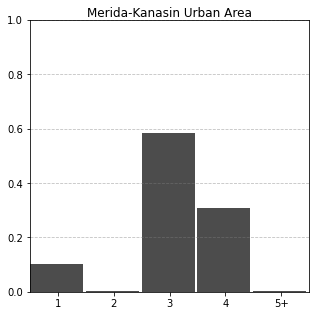

In [116]:
max_value = 4
all_others = sum(list(prop.values())[max_value + 1:])
prop = {key:value for key, value in prop.items() if key <= max_value}
prop[max_value + 1] = all_others
lefts = [x - 0.5 for x in prop.keys()]

fig, ax = plt.subplots(figsize=(5,5))
ax.bar(lefts, prop.values(), width=0.95, alpha=0.7,
           color='k', linewidth=0, align='edge')

xticklabels = list(range(0, max_value + 1)) + ['{}+'.format(max_value + 1)]
ax.set_xticks(list(range(len(xticklabels))))
ax.set_xticklabels(xticklabels)
ax.set_title('Merida-Kanasin Urban Area', fontsize=12, y=0.99)
ax.set_xlim(0.5, max_value + 1.5)
ax.set_ylim(0, 1)
ax.yaxis.grid(True, linestyle='--', which='major',
                   color='grey', alpha=.50)
plt.show()

In [117]:
stats['circuity_avg']

0.963558224154847

In [118]:
stats.describe()

count     42.000000
unique    42.000000
top        0.963558
freq       1.000000
Name: 0, dtype: float64

In [120]:
stats['intersection_density_km']

29.624133648857985

## Analyzing AGEB measures

In [138]:
stats_ageb = pd.read_csv('stats_every_ageb.csv', encoding='utf-8')

In [139]:
def updateCentralityScores(local_scores, global_scores):
    """
    PARAMETERS:
        local_scores: a dictionary where key is the node, and the value is the the score
        global_scores: same as current_scores
    OUTPUT:
        new_scores: a dictionary where key is the node, and the value is the the score
    """
    # update the scores of each node
    new_scores = {}
    for node in local_scores:
        if (node in global_scores): # check if dictionaries share key (or node)
            new_scores[node] = global_scores[node] # update the global betweenness score for each node
            
    return new_scores

In [140]:
# set the global scores from the main road network of the city
btwn_scores = ast.literal_eval(stats['betweenness_centrality'])
closeness_scores = ast.literal_eval(stats['closeness_centrality'])

In [141]:
# create a new column for storing the nodes of each ageb
stats_ageb['nodes'] = ""

In [142]:
for row in range(len(stats_ageb)):
    try:
        # get the scores of each AGEB to be updated
        ageb_btwn = stats_ageb['betweenness_centrality'].iloc[row]
        ageb_btwn_avg = stats_ageb['betweenness_centrality_avg'].iloc[row]
        ageb_closeness = stats_ageb['closeness_centrality'].iloc[row]
        ageb_closeness_avg = stats_ageb['closeness_centrality_avg'].iloc[row]

        # using the ast modul to convert the string-like dict into a valid dict
        ageb_btwn_scores = ast.literal_eval(ageb_btwn)
        ageb_closeness_scores = ast.literal_eval(ageb_closeness)
        
        # take the dictionary of scores and extract their nodes into a list
        # important to note that betweennes and closeness nodes are somewhat different because
        # betweenness is calculated using a DiGraph whereas closeness with a multiDiGraph
        # in this case we will use the multidigraph nodes, for that we extract the nodes from the closeness centrality
        node_list = [node for node in ageb_closeness_scores]
        
        # create a new column for nodes and add the list of nodes as its values
        stats_ageb['nodes'].iloc[row] = node_list

        # update the scores of each node
        new_btwn_scores = updateCentralityScores(ageb_btwn_scores, btwn_scores)
        new_closeness_scores = updateCentralityScores(ageb_closeness_scores, closeness_scores)

        # get the new average of each AGEB
        btwn_avg = sum(new_btwn_scores.values()) / len(new_btwn_scores)
        closeness_avg = sum(new_closeness_scores.values()) / len(new_closeness_scores)

        # update into the dataframe
        ageb_btwn = new_btwn_scores
        ageb_btwn_avg = btwn_avg
        ageb_closeness = new_closeness_scores
        ageb_closeness_avg = closeness_avg
    except Exception as e:
        print('Row {} failed: {}'.format(row, e))

Row 68 failed: division by zero
Row 71 failed: division by zero
Row 236 failed: division by zero
Row 263 failed: division by zero
Row 580 failed: malformed node or string: nan


In [143]:
# drop the AGEBs that the largest connected component of the city does not include any node
stats_ageb.drop(stats_ageb.index[[68,71,236,263,580]], inplace=True)
stats_ageb.reset_index(inplace=True, drop=True)

In [145]:
# save the filtered stats with nodes included
stats_ageb.to_csv('stats_every_ageb_with_nodes.csv', encoding='utf-8', index=False)

In [12]:
stats_ageb = pd.read_csv('stats_every_ageb_with_nodes.csv', encoding='utf-8')

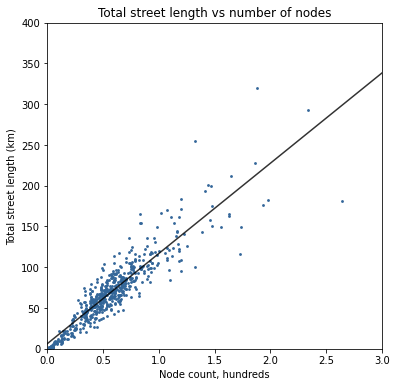

In [152]:
fig, ax = plt.subplots(figsize=(6, 6))
x = stats_ageb['n'] / 100
y = stats_ageb['street_length_total'] / 100

xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max()/100)*100] #round to nearest greater 10

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.8, linewidth=1.5, zorder=1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
#ax.set_xlim((0,15000))
#ax.set_ylim((0,3000))

ax.set_title('Total street length vs number of nodes')
ax.set_xlabel('Node count, hundreds')
ax.set_ylabel('Total street length (km)')

#fig.savefig(filename='images/usa-ua-street-length-vs-nodes', dpi=300, bbox_inches='tight')
plt.show()

In [153]:
print('r-squared:', round(results.rsquared, 2))
results.params

r-squared: 0.82


const      6.157427
n        110.718142
dtype: float64

In [13]:
# unpack k-counts and k-proportion dicts into individiual keys:values
def unpack(row):
    stats = row.to_dict()
    try:
        for k, count in ast.literal_eval(stats['streets_per_node_counts']).items():
            stats['int_{}_streets_count'.format(k)] = count
        for k, proportion in ast.literal_eval(stats['streets_per_node_proportion']).items():
            stats['int_{}_streets_prop'.format(k)] = proportion
    except Exception as e:
        print(e)
        pass
        
    return pd.Series(stats)

In [14]:
stats_ageb = stats_ageb.apply(unpack, axis=1)

In [32]:
stats_ageb.columns

Index(['ageb_id', 'area', 'area_km', 'avg_neighbor_degree',
       'avg_neighbor_degree_avg', 'avg_weighted_neighbor_degree',
       'avg_weighted_neighbor_degree_avg', 'betweenness_centrality',
       'betweenness_centrality_avg', 'center', 'circuity_avg', 'city',
       'city_id', 'clean_intersection_count', 'clean_intersection_density_km',
       'closeness_centrality', 'closeness_centrality_avg',
       'clustering_coefficient', 'clustering_coefficient_avg',
       'clustering_coefficient_weighted',
       'clustering_coefficient_weighted_avg', 'degree_centrality',
       'degree_centrality_avg', 'diameter', 'eccentricity',
       'edge_connectivity', 'edge_density_km', 'edge_length_avg',
       'edge_length_total', 'geo_id', 'int_0_streets_count',
       'int_0_streets_prop', 'int_1_streets_count', 'int_1_streets_prop',
       'int_2_streets_count', 'int_2_streets_prop', 'int_3_streets_count',
       'int_3_streets_prop', 'int_4_streets_count', 'int_4_streets_prop',
       'int_5_

In [35]:
summary = stats_ageb.drop(columns=['ageb_id', 'city_id', 'town_id', 'state_id'])
summary = summary.describe().T.drop(['count', '25%', '75%'], axis=1).applymap(lambda x: round(x, 3))
summary['dispersion_idx'] = (summary['std']**2) / summary['mean']
#summary.to_csv('summary_agebs.csv', encoding='utf-8')
summary

,mean,std,min,50%,max,dispersion_idx
area,5.740506e+05,5.118186e+05,1.421736e+04,4.707436e+05,7.612708e+06,4.563331e+05
area_km,5.740000e-01,5.120000e-01,1.400000e-02,4.710000e-01,7.613000e+00,4.566969e-01
avg_neighbor_degree_avg,2.488000e+00,4.660000e-01,5.000000e-01,2.576000e+00,3.414000e+00,8.728135e-02
avg_weighted_neighbor_degree_avg,3.900000e-02,1.200000e-02,5.000000e-03,3.900000e-02,7.700000e-02,3.692308e-03
betweenness_centrality_avg,9.600000e-02,5.100000e-02,0.000000e+00,8.900000e-02,3.330000e-01,2.709375e-02
circuity_avg,9.590000e-01,6.200000e-02,9.320000e-01,9.410000e-01,1.741000e+00,4.008342e-03
clean_intersection_count,4.395700e+01,2.299000e+01,1.000000e+00,4.200000e+01,1.420000e+02,1.202403e+01
clean_intersection_density_km,9.234800e+01,4.101100e+01,6.352000e+00,8.964100e+01,2.418180e+02,1.821265e+01
closeness_centrality_avg,2.000000e-03,2.000000e-03,0.000000e+00,2.000000e-03,2.200000e-02,2.000000e-03
clustering_coefficient_avg,2.600000e-02,3.800000e-02,0.000000e+00,1.600000e-02,5.000000e-01,5.553846e-02


In [11]:
summary

,mean,std,min,50%,max,dispersion_idx
area,5.740506e+05,5.118186e+05,1.421736e+04,4.707436e+05,7.612708e+06,4.563331e+05
area_km,5.740000e-01,5.120000e-01,1.400000e-02,4.710000e-01,7.613000e+00,4.566969e-01
avg_neighbor_degree_avg,2.488000e+00,4.660000e-01,5.000000e-01,2.576000e+00,3.414000e+00,8.728135e-02
avg_weighted_neighbor_degree_avg,3.900000e-02,1.200000e-02,5.000000e-03,3.900000e-02,7.700000e-02,3.692308e-03
betweenness_centrality_avg,9.600000e-02,5.100000e-02,0.000000e+00,8.900000e-02,3.330000e-01,2.709375e-02
circuity_avg,9.590000e-01,6.200000e-02,9.320000e-01,9.410000e-01,1.741000e+00,4.008342e-03
city_id,4.897200e+01,2.865000e+00,4.100000e+01,5.000000e+01,5.000000e+01,1.676106e-01
clean_intersection_count,4.395700e+01,2.299000e+01,1.000000e+00,4.200000e+01,1.420000e+02,1.202403e+01
clean_intersection_density_km,9.234800e+01,4.101100e+01,6.352000e+00,8.964100e+01,2.418180e+02,1.821265e+01
closeness_centrality_avg,2.000000e-03,2.000000e-03,0.000000e+00,2.000000e-03,2.200000e-02,2.000000e-03


In [9]:
variable = 'intersection_density_km'
stats_ageb[['geo_id', variable]].sort_values(by=variable)

,geo_id,intersection_density_km
66,3105000933816,8.402510
565,3105000776331,9.225642
73,3105001116276,9.351580
203,3105000014778,10.587291
337,310500001078A,12.216414
...,...,...
347,3105000012324,287.159460
124,3105000014532,295.429613
332,3105000013197,302.365674
380,3105000014142,351.016299


In [162]:
stats_ageb['area'].describe()

count    5.780000e+02
mean     5.740506e+05
std      5.118186e+05
min      1.421736e+04
25%      3.142733e+05
50%      4.707436e+05
75%      6.745055e+05
max      7.612708e+06
Name: area, dtype: float64

In [163]:
# only look at large neighborhoods
min_area = 4707436 # the 50% of the previous step
variable = 'streets_per_node_avg'
stats_ageb[stats_ageb['area'] > min_area][['geo_id', variable]].sort_values(by=variable)

,geo_id,streets_per_node_avg
337,310500001078A,2.803738


<AxesSubplot:>

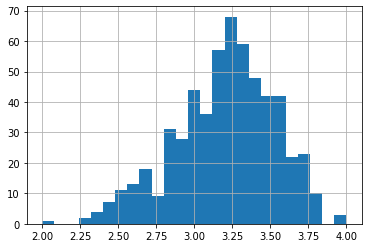

In [174]:
stats_ageb['streets_per_node_avg'].hist(bins=25)

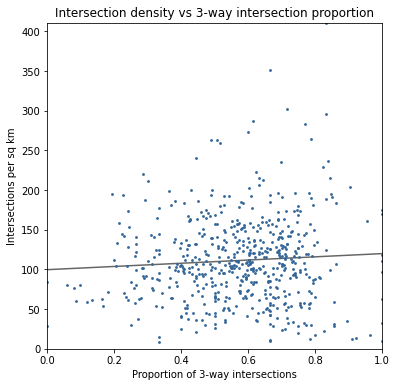

In [187]:
#df_plot = stats_ageb.dropna(subset=['int_3_streets_prop'])
fig, ax = plt.subplots(figsize=(6, 6))
y = stats_ageb['intersection_density_km']
x = stats_ageb['int_3_streets_prop']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs 3-way intersection proportion')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Proportion of 3-way intersections')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

In [188]:
print('r-squared:', results.rsquared)
results.params

r-squared: 0.004441452112327937


const                 99.714236
int_3_streets_prop    20.219624
dtype: float64

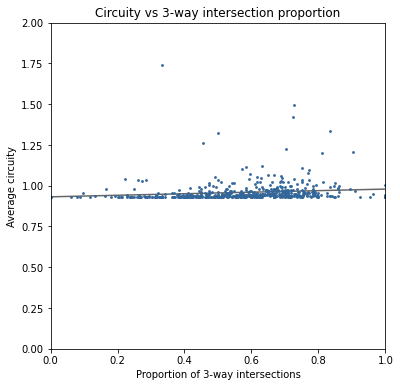

In [189]:
fig, ax = plt.subplots(figsize=(6, 6))
y = stats_ageb['circuity_avg']
x = stats_ageb['int_3_streets_prop']

#ylim = (1,1.2)
#xlim = (0,0.5)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Circuity vs 3-way intersection proportion')
ax.set_ylabel('Average circuity')
ax.set_xlabel('Proportion of 3-way intersections')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

In [190]:
print('r-squared:', results.rsquared)
results.params

r-squared: 0.017785614824451845


const                 0.931889
int_3_streets_prop    0.047445
dtype: float64

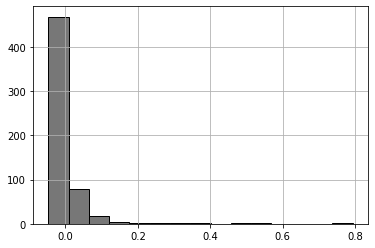

In [194]:
ax = results.resid.hist(bins=15, figsize=(6,4), fc='#777777', ec='k')

In [195]:
variable = 'street_length_avg'
stats_ageb[['geo_id', variable]].sort_values(by=variable, ascending=False)

,geo_id,street_length_avg
565,3105000776331,198.010000
437,3105000015386,182.792073
564,3105000774941,181.908500
390,3105000016172,181.827000
354,3105000014937,179.823333
...,...,...
380,3105000014142,48.829148
138,3105000017039,47.785458
71,3105001116280,44.488000
16,3104100010352,42.713500


<AxesSubplot:>

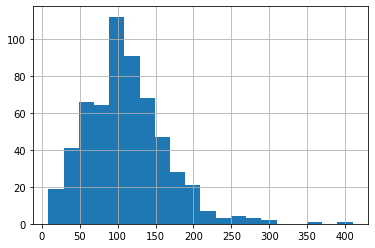

In [196]:
stats_ageb['intersection_density_km'].hist(bins=20)

In [197]:
variable = 'intersection_density_km'
stats_ageb[['geo_id', variable]].sort_values(by=variable, ascending=False)

,geo_id,intersection_density_km
138,3105000017039,410.011278
380,3105000014142,351.016299
332,3105000013197,302.365674
124,3105000014532,295.429613
347,3105000012324,287.159460
...,...,...
337,310500001078A,12.216414
203,3105000014778,10.587291
73,3105001116276,9.351580
565,3105000776331,9.225642


In [203]:
# node and edge density per km are hard to interpret when using municipal boundaries
# as municipal boundaries vary greatly in their extents around the built-up area
by_towncity = stats_ageb.groupby(['city_id', 'town_id'])[['intersection_density_km', 
                     'streets_per_node_avg', 
                     'circuity_avg',
                     'street_length_avg']].median().sort_values(by='intersection_density_km').applymap(lambda x: round(x, 2))
#by_town.sort_index().to_csv('by_state.csv', encoding='utf-8')
by_towncity.sort_index()

intersection_density_km  streets_per_node_avg  circuity_avg  \
city_id town_id                                                                
41.0    1.0                        96.46                  3.00          0.95   
50.0    1.0                       112.54                  3.27          0.94   
        75.0                       37.02                  3.17          0.94   
        77.0                       30.71                  3.00          0.93   
        84.0                       55.00                  2.84          0.98   
        93.0                       34.28                  2.98          0.99   
        111.0                      28.21                  2.62          0.94   

                 street_length_avg  
city_id town_id                     
41.0    1.0                  88.61  
50.0    1.0                  87.66  
        75.0                142.02  
        77.0                148.71  
        84.0                109.71  
        93.0                147.21  
        111.0               134.50

In [201]:
by_city = stats_ageb.groupby('city_id')[['intersection_density_km', 
                     'streets_per_node_avg', 
                     'circuity_avg',
                     'street_length_avg']].median().sort_values(by='intersection_density_km').applymap(lambda x: round(x, 2))
#by_town.sort_index().to_csv('by_state.csv', encoding='utf-8')
by_city.sort_index()

,intersection_density_km,streets_per_node_avg,circuity_avg,street_length_avg
city_id,,,,
41.0,96.46,3.00,0.95,88.61
50.0,108.79,3.25,0.94,88.62


### Map the AGEBs by attribute

In [5]:
# load the census data including AGEBs shapes
ageb_inegi = gpd.read_file('merida_kanasing_ageb_censo_data/merida_kanasing_ageb_censo_data.shp')

ageb_inegi.sort_values(by=['CVEGEO'], ignore_index=True, inplace=True)
stats_ageb.sort_values(by=['geo_id'], ignore_index=True, inplace=True)

stats_ageb.drop(columns=['city', 'city_id', 'town', 'town_id', 'ageb_id', 'state', 'state_id'], inplace = True)
# change name for merging columns
stats_ageb.rename(columns={'geo_id':'CVEGEO'}, inplace=True)

mid_kan_ageb_all_data = ageb_inegi.merge(stats_ageb, on=['CVEGEO'], how='inner')

# add new column for population density
mid_kan_ageb_all_data['pop_density'] = mid_kan_ageb_all_data['POBTOT'] / mid_kan_ageb_all_data['area_km']

In [65]:
data = mid_kan_ageb_all_data

#### Betweenness centrality

In [ ]:
data['VIVTOT'] = data['VIVTOT'].astype('int64')

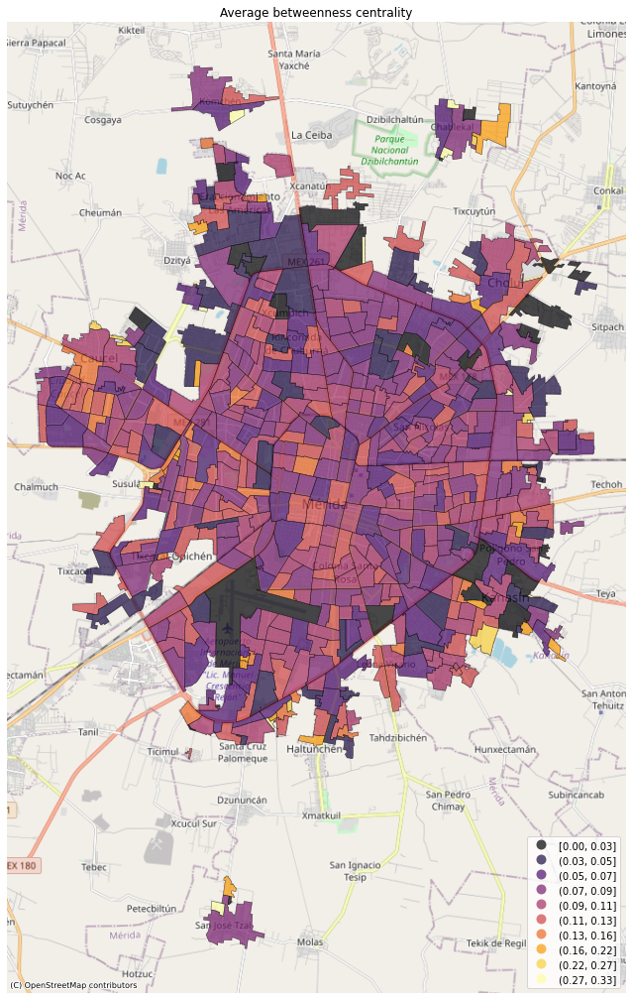

In [111]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'betweenness_centrality_avg'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average betweenness centrality')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

#### Closeness centrality

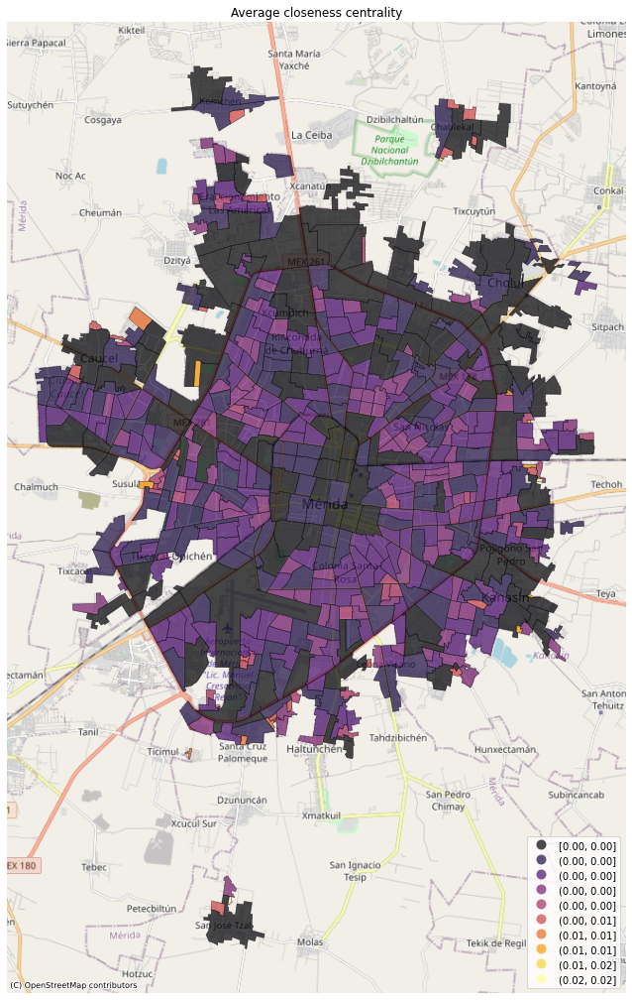

In [112]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'closeness_centrality_avg'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average closeness centrality')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

#### Degree Centrality

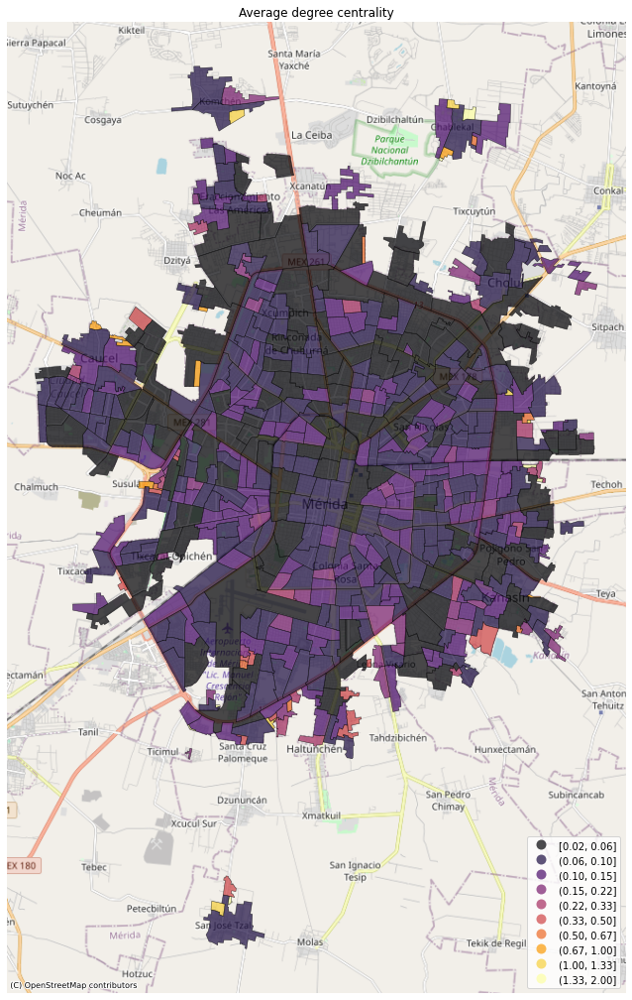

In [113]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'degree_centrality_avg'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average degree centrality')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

#### Intersection density

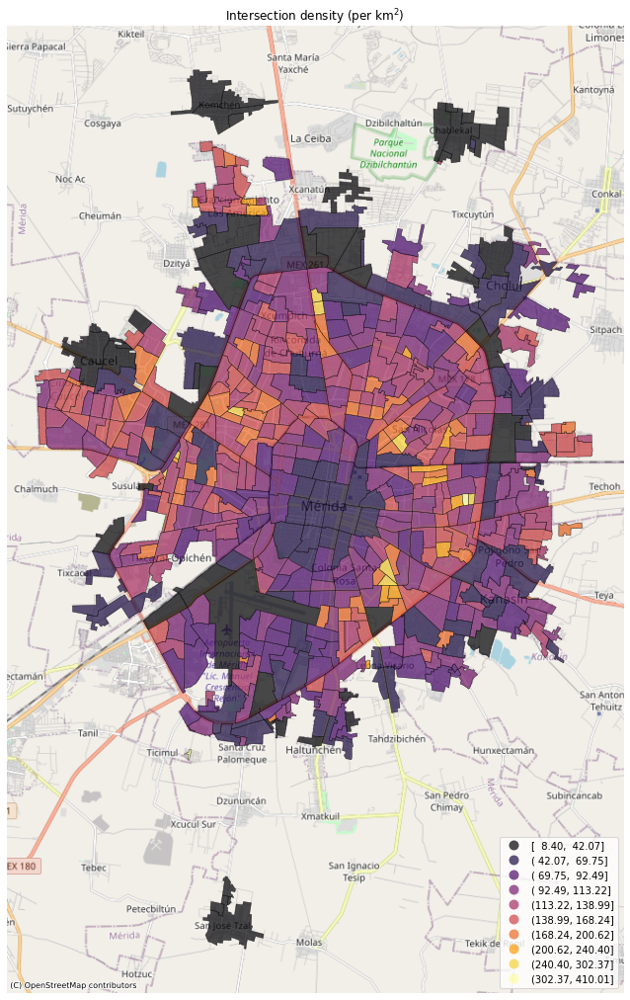

In [66]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'intersection_density_km'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Intersection density (per km$^2$)')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

#### Average streets per node

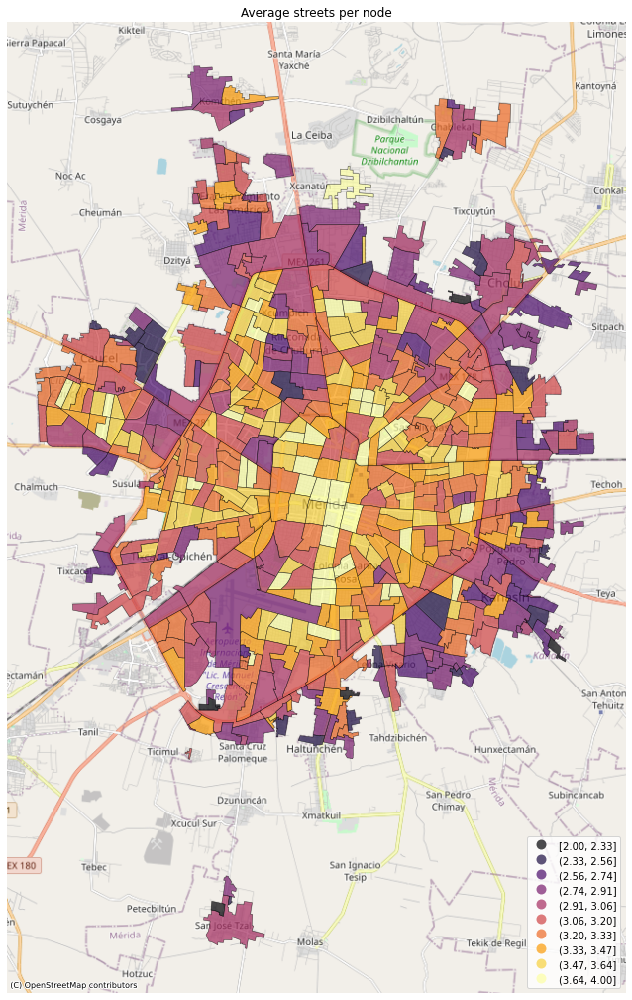

In [67]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'streets_per_node_avg'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average streets per node')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

#### Average street length

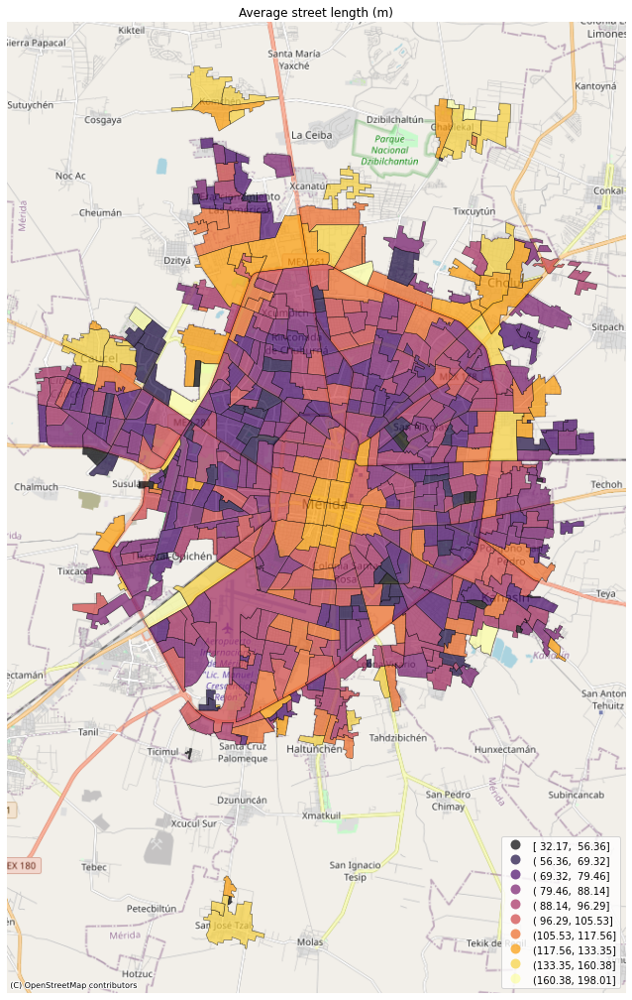

In [68]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'street_length_avg'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Average street length (m)')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

#### Linear relationships with Population density

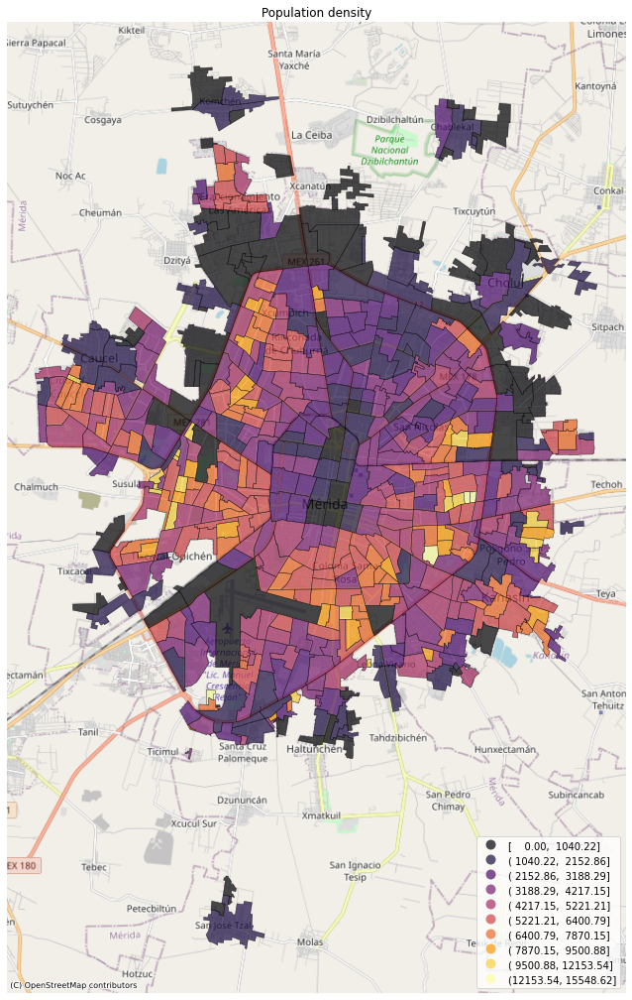

In [81]:
# Plotting 
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'pop_density'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Population density')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

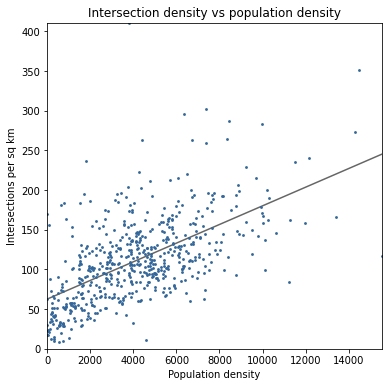

In [53]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['intersection_density_km']
x = data['pop_density']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs population density')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Population density')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

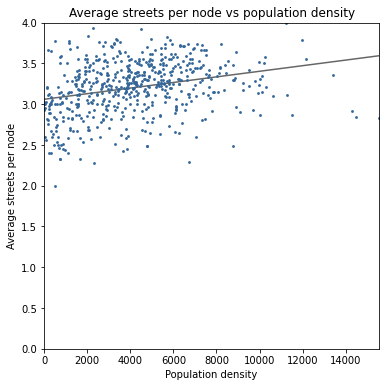

In [59]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['streets_per_node_avg']
x = data['pop_density']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs population density')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Population density')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

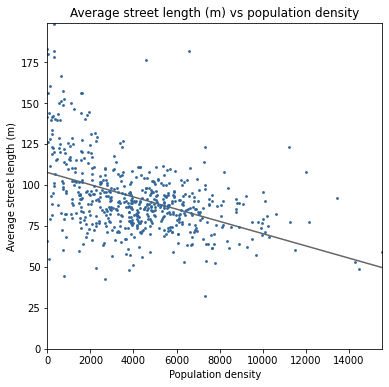

In [64]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['street_length_avg']
x = data['pop_density']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs population density')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Population density')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

#### Linear relationships with Population with occupation

In [72]:
data['POCUPADA'] = data['POCUPADA'].astype('int64')

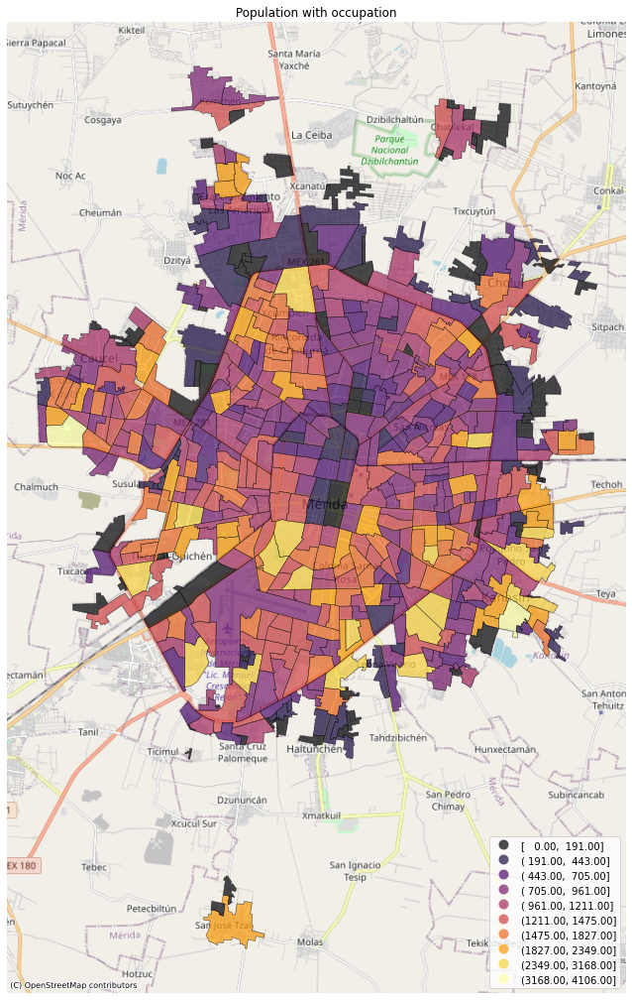

In [82]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'POCUPADA'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Population with occupation')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

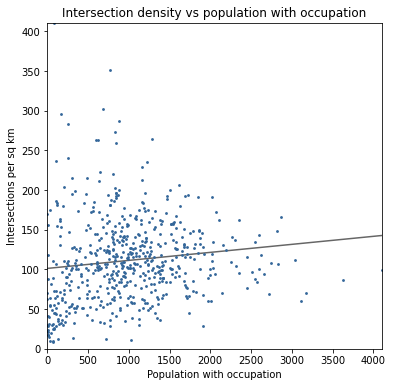

In [74]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['intersection_density_km']
x = data['POCUPADA']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs population with occupation')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Population with occupation')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

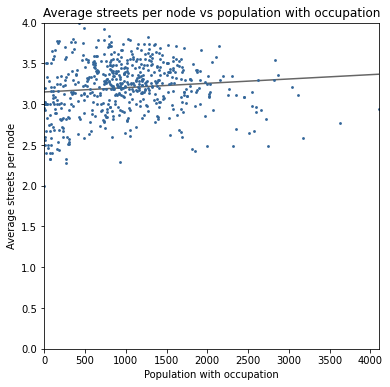

In [90]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['streets_per_node_avg']
x = data['POCUPADA']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs population with occupation')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Population with occupation')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

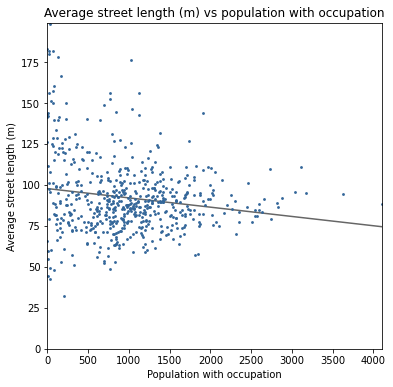

In [77]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['street_length_avg']
x = data['POCUPADA']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs population with occupation')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Population with occupation')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

#### Linear relationships with Population economically active

In [85]:
data['PEA'] = data['PEA'].astype('int64')

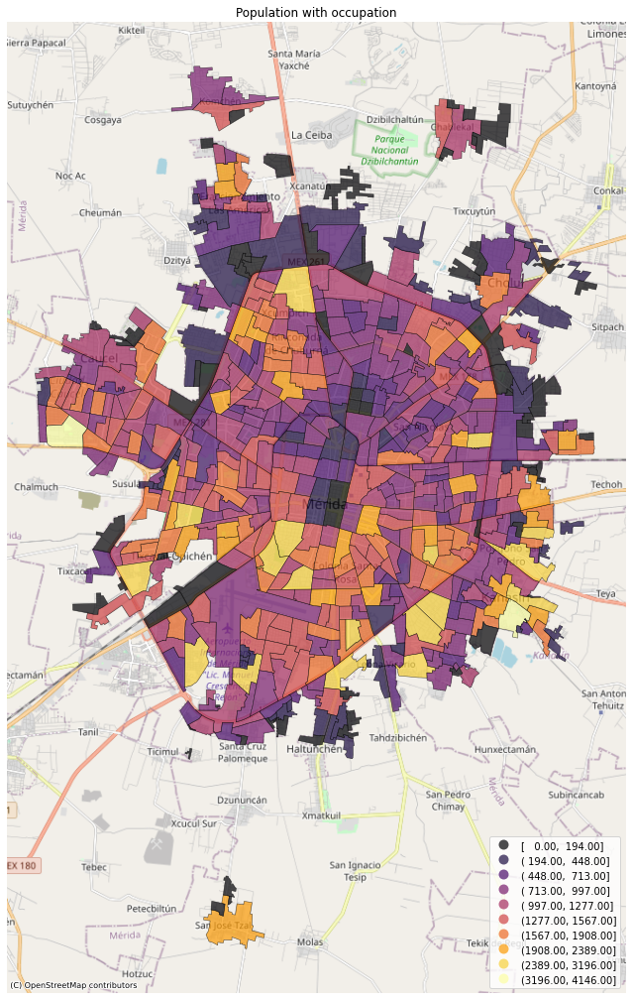

In [86]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'PEA'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Population with occupation')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

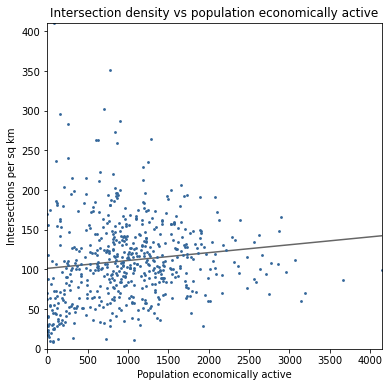

In [87]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['intersection_density_km']
x = data['PEA']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs population economically active')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Population economically active')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

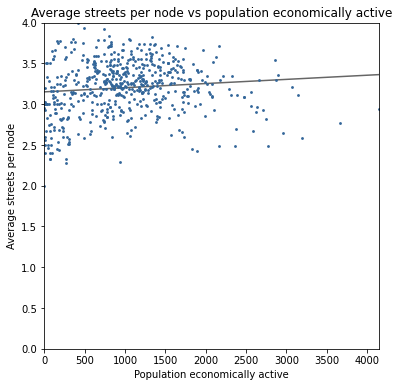

In [88]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['streets_per_node_avg']
x = data['PEA']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs population economically active')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Population economically active')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

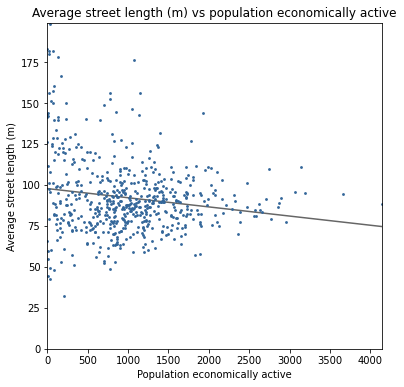

In [89]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['street_length_avg']
x = data['PEA']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs population economically active')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Population economically active')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

#### Linear relationships with Population with medical insurance

In [91]:
data['PDER_SS'] = data['PDER_SS'].astype('int64')

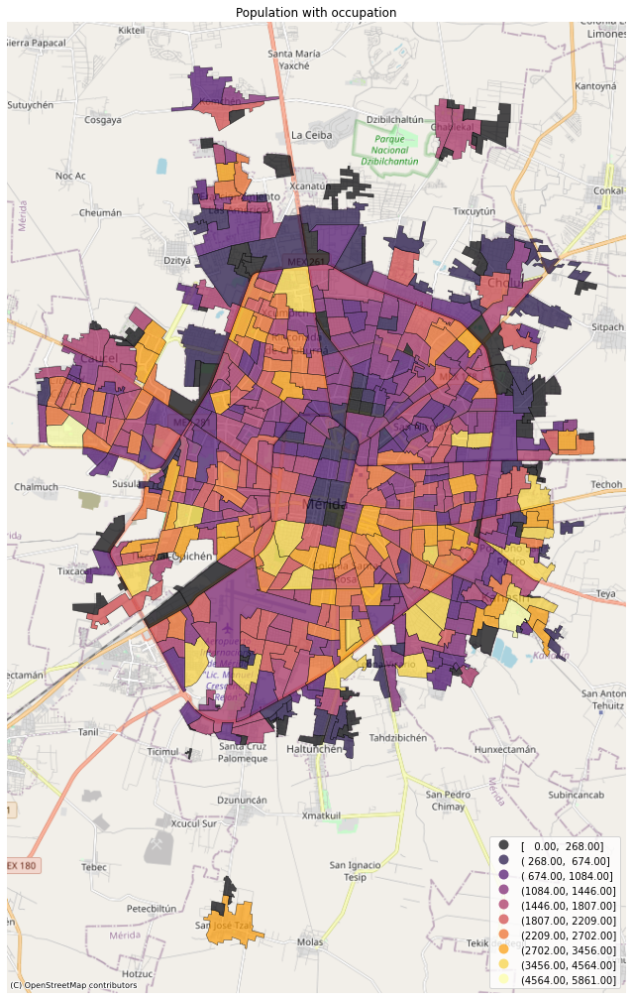

In [92]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'PDER_SS'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Population with occupation')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

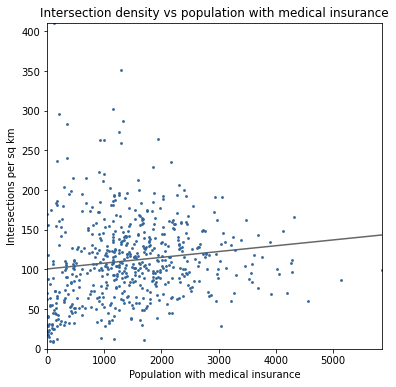

In [96]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['intersection_density_km']
x = data['PDER_SS']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs population with medical insurance')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Population with medical insurance')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

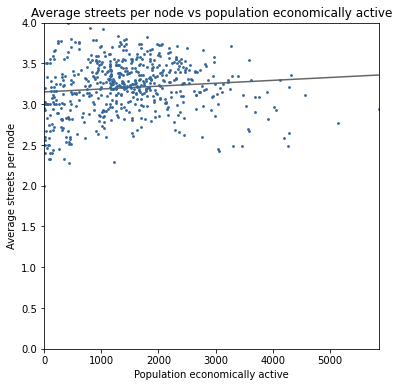

In [94]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['streets_per_node_avg']
x = data['PDER_SS']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs population with medical insurance')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Population with medical insurance')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

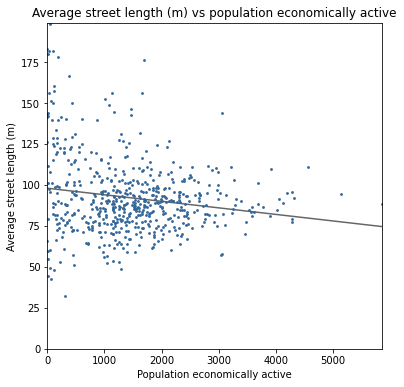

In [95]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['street_length_avg']
x = data['PDER_SS']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs population with medical insurance')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Population with medical insurance')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

#### Linear relationships with Households

In [97]:
data['VIVTOT'] = data['VIVTOT'].astype('int64')

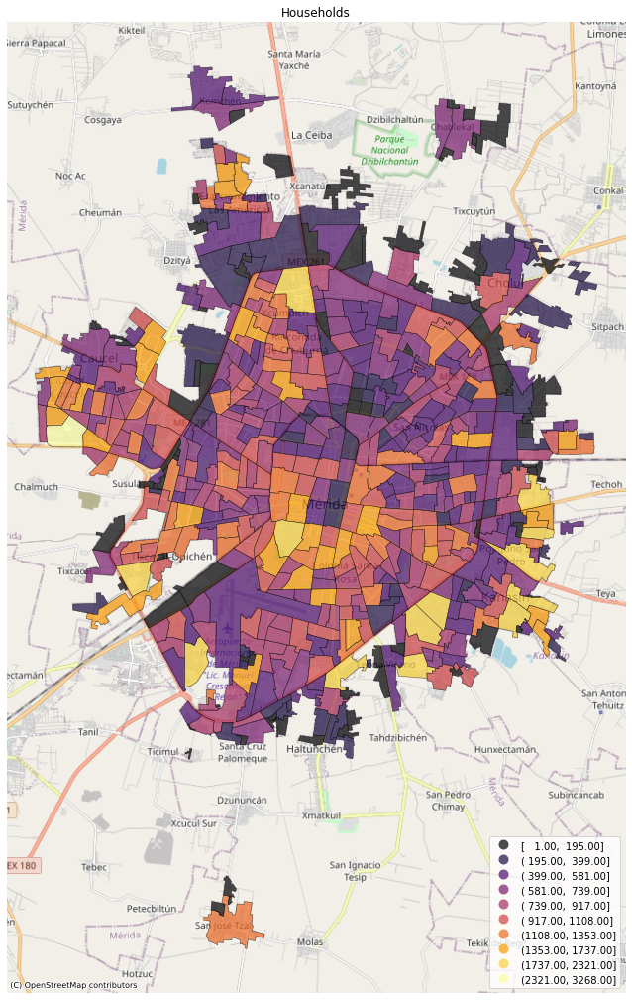

In [98]:
fig, ax = plt.subplots(1, figsize=(18, 18))

variable = 'VIVTOT'
data.plot(ax=ax, 
          column=variable, 
          cmap='inferno', 
          scheme='fisherjenks', 
          legend = True, 
          k=10,
          edgecolor='black',
          legend_kwds={"loc": 4},
          linewidth=0.5, 
          alpha=0.7)
ctx.add_basemap(ax, 
                crs=data.crs,
                source=ctx.providers.OpenStreetMap.CH
                      )
ax.set_title('Households')
ax.axis('off')
#plt.savefig('population_merida&Kanasin_density2020.jpg')
plt.show()

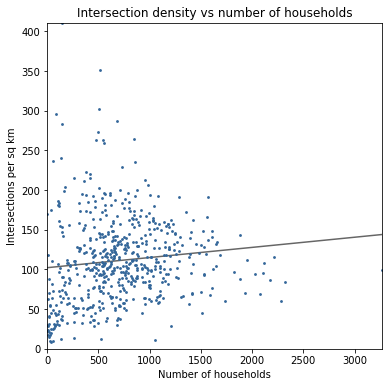

In [99]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['intersection_density_km']
x = data['VIVTOT']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Intersection density vs number of households')
ax.set_ylabel('Intersections per sq km')
ax.set_xlabel('Number of households')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

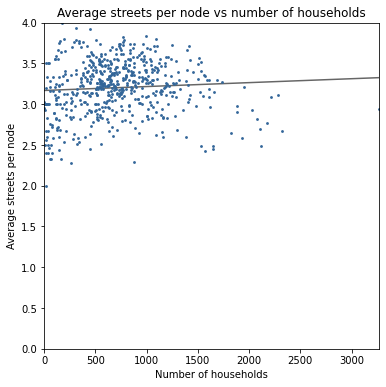

In [100]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['streets_per_node_avg']
x = data['VIVTOT']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average streets per node vs number of households')
ax.set_ylabel('Average streets per node')
ax.set_xlabel('Number of households')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()

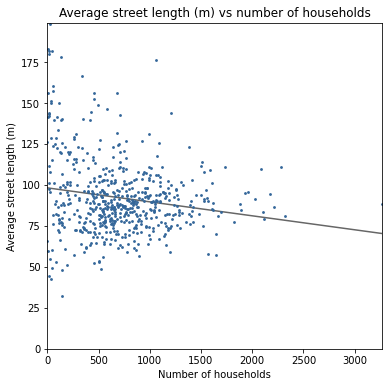

In [101]:
fig, ax = plt.subplots(figsize=(6, 6))
y = data['street_length_avg']
x = data['VIVTOT']

#ylim = (0,1000)
#xlim = (0,1)
xlim = [0, math.ceil(x.max())]
ylim = [0, math.ceil(y.max())]

# regress y on x
results = sm.OLS(y, sm.add_constant(x)).fit()

# calculate estimated y values for regression line
x_line = pd.Series(xlim)
y_est = x_line * results.params[1] + results.params[0]

# draw regression line and scatter plot the points
ax.plot(x_line, y_est, c='k', alpha=0.6, linewidth=1.5, zorder=-1)
ax.scatter(x=x, y=y, c='#336699', linewidths=0, alpha=1, s=8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Average street length (m) vs number of households')
ax.set_ylabel('Average street length (m)')
ax.set_xlabel('Number of households')

#fig.savefig(filename='images/usa-ua-circuity-vs-k4', dpi=300, bbox_inches='tight')
plt.show()